In [1]:
%cd ../..

/home/eli/AnacondaProjects/epych


In [2]:
import glob
import h5py
import logging
import math
import matplotlib.pyplot as plt
import numpy as np
import os.path
import pandas as pd
import pickle
import quantities as pq

In [3]:
import epych
import epych.recording as recording

In [4]:
%matplotlib inline

In [5]:
logging.basicConfig(level=logging.INFO)

In [6]:
def epoch_intervals(intervals, epoch):
    mask = intervals[epoch][:].astype(bool)
    return np.stack((intervals['start_time'][mask], intervals['stop_time'][mask]), axis=-1)

In [7]:
def trial_intervals(intervals):
    trial_nums = intervals['trial_num'][:].astype(int)
    trials = np.unique(trial_nums)
    startstops = []
    for trial in trials:
        indices = np.nonzero(trial_nums == trial)[0]
        startstops.append((intervals['start_time'][indices[0]], intervals['stop_time'][indices[-1]]))
    return np.array(startstops)

In [8]:
def trial_stimulus_intervals(intervals):
    trial_nums = intervals['trial_num'][:].astype(int)
    trials = np.unique(trial_nums)
    stimuli = {k: [] for k in range(5)}
    for trial in trials:
        for index, interval in enumerate(np.nonzero(trial_nums == trial)[0]):
            stimuli[index].append((intervals['start_time'][interval], intervals['stop_time'][interval]))
    return {k: np.array(v) for k, v in stimuli.items()}

In [9]:
CORTICAL_CONDUCTIVITY = 0.4
CONDITIONS = ["go_gloexp", "lo_gloexp", "go_seqctl", "seqctl"]
PRETRIAL_SECONDS = 0.5
POSTTRIAL_SECONDS = 0.5

In [10]:
# from neo import AnalogSignal
# import quantities as pq
# from elephant.current_source_density import estimate_csd

# def current_source_density(lfps, sampling_hz, channel_locs, method="KCSD2D"):
#     neo_lfp = AnalogSignal(lfps.transpose(), units="V", sampling_rate = sampling_hz*pq.Hz)
#     neo_lfp.annotate(coordinates = channel_locs)
#     return np.array(estimate_csd(neo_lfp, method=method)).transpose()

In [11]:
# def laminar_csd(lfps, sampling_hz, channel_electrodes):
#     column_lfps = lfps[0::4, :]
#     channel_mm = channel_electrodes['vertical'][0::4, np.newaxis]
#     return current_source_density(column_lfps, sampling_hz, channel_mm, method='StandardCSD')

In [12]:
# def multilaminar_csd(lfps, sampling_hz, channel_electrodes):
#     laminar_lfps = lfps.mean(axis=-1)
#     channel_mm = np.stack((channel_electrodes['horizontal'], channel_electrodes['vertical']), axis=1) * pq.mm
#     return current_source_density(laminar_lfps, sampling_hz, channel_mm)

In [13]:
def mark_areas(ax, areas):
    prev_area = ""
    for a, area in enumerate(areas):
        if area == prev_area:
            continue
        prev_area = area
        line = ax.axhline(a, linestyle='--', color='black')
        ax.annotate(area, line.get_xydata()[0, :])

In [14]:
NWB_FILES = glob.glob('/mnt/data/*.nwb')

In [15]:
PILOT_FILES = []

In [16]:
csds = {}

In [17]:
def probe_electrode_metadata(electrodes, probe, channels):
    indices = (electrodes['group_name'][:] == probe.encode()).nonzero()[0]
    return {
        'areas': np.array([area.decode() for area in electrodes['location'][indices][channels]]),
        'horizontal': electrodes['probe_horizontal_position'][indices][channels] * pq.mm,
        'vertical': electrodes['probe_vertical_position'][indices][channels] * pq.mm,
    }

In [18]:
def hippocampal_areas(probe_areas):
    for (c, a) in enumerate(probe_areas):
        if "DG-" in a or "CA" in a:
            yield (c, a)

def visual_areas(probe_areas):
    for (c, a) in enumerate(probe_areas):
        if "VIS" in a:
            yield (c, a)

def subcortical_areas(probe_areas):
    for (c, a) in enumerate(probe_areas):
        if "DG-" in a or "CA" in a or "MB" in a or "SCi" in a or "POST" in a:
            yield (c, a)

In [19]:
def hippocampal_electrodes(probe_electrodes):
    channels = [c for (c, a) in hippocampal_areas(probe_electrodes['areas'])]
    return {
        'areas': probe_electrodes['areas'][channels],
        'horizontal': probe_electrodes['horizontal'][channels],
        'vertical': probe_electrodes['vertical'][channels]
    }

def visual_electrodes(probe_electrodes):
    channels = [c for (c, a) in visual_areas(probe_electrodes['areas'])]
    return {
        'areas': probe_electrodes['areas'][channels],
        'horizontal': probe_electrodes['horizontal'][channels],
        'vertical': probe_electrodes['vertical'][channels]
    }

def subcortical_electrodes(probe_electrodes):
    channels = [c for (c, a) in subcortical_areas(probe_electrodes['areas'])]
    return {
        'areas': probe_electrodes['areas'][channels],
        'horizontal': probe_electrodes['horizontal'][channels],
        'vertical': probe_electrodes['vertical'][channels]
    }

In [20]:
CONDITION = CONDITIONS[0]
NWB_FILE  = NWB_FILES[-1]

In [21]:
nwb = h5py.File(NWB_FILE, 'r')
electrodes = nwb['general']['extracellular_ephys']['electrodes']
probes = sorted([probe.decode() for probe in set(electrodes['group_name'][:])])
glo_intervals = nwb['intervals']['passive_glo']

In [22]:
signals = {}

In [23]:
for p, probe in enumerate(probes):
    probe_lfp = "probe_%d_lfp" % p
    probe_lfp = probe_lfp + "/" + probe_lfp + "_data"
    probe_lfps = nwb['acquisition/'][probe_lfp]
    timestamps = probe_lfps["timestamps"][:]
    dt = (timestamps[1:] - timestamps[:-1]).mean()
    probe_data = np.transpose(probe_lfps["data"])[:, :, np.newaxis]

    probe_electrodes = electrodes["group_name"][:] == probe.encode()
    channels = {
        "horizontal": electrodes["probe_horizontal_position"][probe_electrodes],
        "id": electrodes["id"][probe_electrodes],
        "location": electrodes["location"][probe_electrodes],
        "vertical": electrodes["probe_vertical_position"][probe_electrodes],
    }
    channels = {k: v[probe_lfps['electrodes'][:]] for k, v in channels.items()}
    probe_channels = pd.DataFrame(data=channels, columns=["horizontal", "location", "vertical"], index=channels['id'])
    assert probe_data.shape[0] == len(probe_channels)

    signals[probe] = epych.signals.lfp.ContinuousLfp(probe_channels, probe_data, dt, timestamps)

In [24]:
epochs = {
    "start": np.array([]),
    "end": np.array([]),
    "type": [],
}

In [25]:
trials = trial_intervals(glo_intervals)
trial_times = trials[:, 0]
epochs["start"] = np.concatenate((epochs["start"], trials[:, 0]), axis=0)
epochs["end"] = np.concatenate((epochs["end"], trials[:, 1]), axis=0)
epochs["type"] = epochs["type"] + ["trial"] * trials.shape[0]

In [26]:
cond_times = epoch_intervals(glo_intervals, CONDITION)
epochs["start"] = np.concatenate((epochs["start"], cond_times[:, 0]), axis=0)
epochs["end"] = np.concatenate((epochs["end"], cond_times[:, 1]), axis=0)
epochs["type"] = epochs["type"] + [CONDITION] * cond_times.shape[0]

In [27]:
cond_times = epoch_intervals(glo_intervals, "lo_gloexp")
epochs["start"] = np.concatenate((epochs["start"], cond_times[:, 0]), axis=0)
epochs["end"] = np.concatenate((epochs["end"], cond_times[:, 1]), axis=0)
epochs["type"] = epochs["type"] + ["lo_gloexp"] * cond_times.shape[0]

In [28]:
stim_times = trial_stimulus_intervals(glo_intervals)
for k, v in stim_times.items():
    epochs["start"] = np.concatenate((epochs["start"], v[:, 0]), axis=0)
    epochs["end"] = np.concatenate((epochs["end"], v[:, 1]), axis=0)
    epochs["type"] = epochs["type"] + ["stim%d" % k] * v.shape[0]

In [29]:
units = {"start": pq.second, "end": pq.second}
epochs = pd.DataFrame(data=epochs, columns=epochs.keys())

In [30]:
recording = recording.Recording(epochs, pd.DataFrame(columns=["trial"]).set_index("trial"), units, **signals)

In [31]:
condition_epochs = recording.intervals["type"] == CONDITION
trial_epochs = recording.intervals["type"] == "trial"

In [32]:
go_sampling = recording.epoch(condition_epochs, trial_epochs, PRETRIAL_SECONDS, POSTTRIAL_SECONDS).baseline_correct(0, PRETRIAL_SECONDS)

In [33]:
erp = go_sampling.erp()

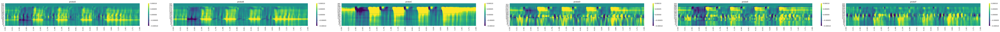

In [34]:
erp.plot(vmin=-1e-4, vmax=1e-4)

In [35]:
csd = go_sampling.smap(lambda sig: sig.downsample(4).current_source_density()).erp()

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b

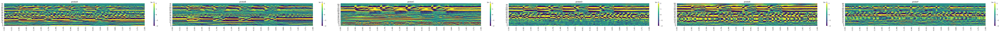

In [36]:
csd.plot(vmin=-2e-5, vmax=2e-5)

In [37]:
oddball_onset = go_sampling.trials['go_gloexp_start'].mean()
oddball_offset = go_sampling.trials['go_gloexp_end'].mean()

evenball_onset = go_sampling.trials['stim2_start'].mean()
evenball_offset = go_sampling.trials['stim2_end'].mean()

In [38]:
oddball = go_sampling[oddball_onset:oddball_offset]
evenball = go_sampling[evenball_onset:evenball_offset]
contrast = oddball - evenball

In [39]:
erp = contrast.erp()

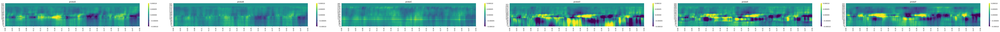

In [40]:
erp.plot(vmin=-1e-4, vmax=1e-4)

In [41]:
condition_epochs = recording.intervals["type"] == "lo_gloexp"
trial_epochs = recording.intervals["type"] == "trial"

In [42]:
lo_sampling = recording.epoch(condition_epochs, trial_epochs, PRETRIAL_SECONDS, POSTTRIAL_SECONDS).baseline_correct(0, PRETRIAL_SECONDS)

In [43]:
erp = lo_sampling.erp()

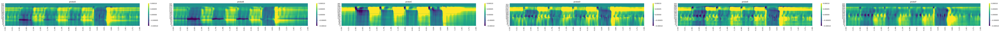

In [44]:
erp.plot(vmin=-1e-4, vmax=1e-4)

In [45]:
csd = lo_sampling.smap(lambda sig: sig.downsample(4).current_source_density()).erp()

discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b = [ 0.607 1.000 0.607 ],                
a = [ 2.213 ]
discrete filter coefficients: 
b

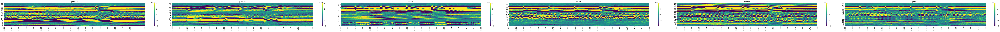

In [46]:
csd.plot(vmin=-2e-5, vmax=2e-5)

In [47]:
oddball_onset = lo_sampling.trials['lo_gloexp_start'].mean()
oddball_offset = lo_sampling.trials['lo_gloexp_end'].mean()

evenball_onset = lo_sampling.trials['stim2_start'].mean()
evenball_offset = lo_sampling.trials['stim2_end'].mean()

In [48]:
oddball = lo_sampling[oddball_onset:oddball_offset]
evenball = lo_sampling[evenball_onset:evenball_offset]
contrast = oddball - evenball

In [49]:
erp = contrast.erp()

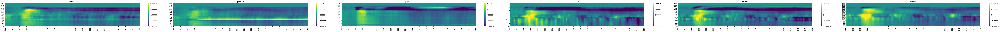

In [50]:
erp.plot(vmin=-1e-4, vmax=1e-4)

In [51]:
# intervals = trial_intervals_with_event(glo_intervals, CONDITION)
# condstim_intervals = event_intervals(glo_intervals, CONDITION)
# stim_onset, stim_offset = (condstim_intervals - intervals[:, np.newaxis, 0]).mean(axis=0)
# P, probe = 2, probes[2]

In [52]:
# lfp_name = "probe_" + str(P) + "_lfp"
# probe_lfps = nwb['acquisition'][lfp_name][lfp_name + '_data']
# probe_electrodes = probe_electrode_metadata(electrodes, probe, probe_lfps['electrodes'][:])

# lfp_hz = int(1 / (probe_lfps['timestamps'][1] - probe_lfps['timestamps'][0]))
# assert lfp_hz > 0
# baseline_samples = int(lfp_hz * PRETRIAL_SECONDS)

# start_samples = nearest_indices(probe_lfps['timestamps'][:], intervals[:, 0] - PRETRIAL_SECONDS)
# stop_samples = nearest_indices(probe_lfps['timestamps'][:], intervals[:, 1] + POSTTRIAL_SECONDS)
# trial_length = (stop_samples - start_samples).min()
# assert trial_length > 0
# for t in range(len(stop_samples)):
#     if stop_samples[t] - start_samples[t] > trial_length:
#         stop_samples[t] = start_samples[t] + trial_length

# trial_lfps = epoch_timeseries(probe_lfps['data'], zip(start_samples, stop_samples))
# trial_lfps = np.swapaxes(trial_lfps, 0, 1)

# erp = correct_baseline(trial_lfps, 0, baseline_samples-1).mean(axis=-1)
# csd = laminar_csd(erp, lfp_hz, probe_electrodes)

In [53]:
# nwb.close()

In [54]:
# downsampled_electrodes = {k: v[0::4] for k, v in probe_electrodes.items()}

In [55]:
# NWB_BASENAME = os.path.splitext(os.path.basename(NWB_FILE))[0]

In [56]:
# fig, axes = plt.subplots(1, 2, figsize=(2 * 15, 3))
# fig.suptitle("Global Oddball (primary visual cortex (VISp), %s, N=%d trials)" % (NWB_BASENAME, trial_lfps.shape[-1]))

# visual_channels = list(visual_areas(probe_electrodes['areas']))
# areas = [a for (c, a) in visual_channels]
# cs = [c for (c, a) in visual_channels]
# probe_area = os.path.commonprefix(areas)

# plot_heatmap(fig, axes[0], erp[cs], "Event related potential", vmin=-1e-4, vmax=1e-4)
# mark_areas(axes[0], areas)
# axes[0].axvline((stim_onset + PRETRIAL_SECONDS) * lfp_hz, linestyle='--', color='lightgreen')
# axes[0].axvline((stim_offset + PRETRIAL_SECONDS) * lfp_hz, linestyle='--', color='red')

# trial_samples = erp.shape[1]
# xtick_locs = np.linspace(0, trial_samples, 20)
# xticks = np.linspace(0., trial_samples / lfp_hz, 20) - stim_onset - PRETRIAL_SECONDS
# xticks = ["%0.2f" % t for t in xticks]
# axes[0].set_xticks(xtick_locs, xticks)

# visual_channels = list(visual_areas(downsampled_electrodes['areas']))
# areas = [a for (c, a) in visual_channels]
# cs = [c for (c, a) in visual_channels]
# probe_area = os.path.commonprefix(areas)

# plot_heatmap(fig, axes[1], csd[cs], "Current Source Density", vmin=-1e-4, vmax=1e-4)
# mark_areas(axes[1], areas)
# axes[1].axvline((stim_onset + PRETRIAL_SECONDS) * lfp_hz, linestyle='--', color='lightgreen')
# axes[1].axvline((stim_offset + PRETRIAL_SECONDS) * lfp_hz, linestyle='--', color='red')

# trial_samples = csd.shape[1]
# xtick_locs = np.linspace(0, trial_samples, 20)
# xticks = np.linspace(0., trial_samples / lfp_hz, 20) - stim_onset - PRETRIAL_SECONDS
# xticks = ["%0.2f" % t for t in xticks]
# axes[1].set_xticks(xtick_locs, xticks)

# fig.tight_layout()
# plt.show()
# fig.savefig(CONDITION + '_visual_slide.svg', format="svg")
# fig.savefig(CONDITION + '_visual_slide.pdf', format="pdf")
# plt.close(fig)